# Preprocesamiento

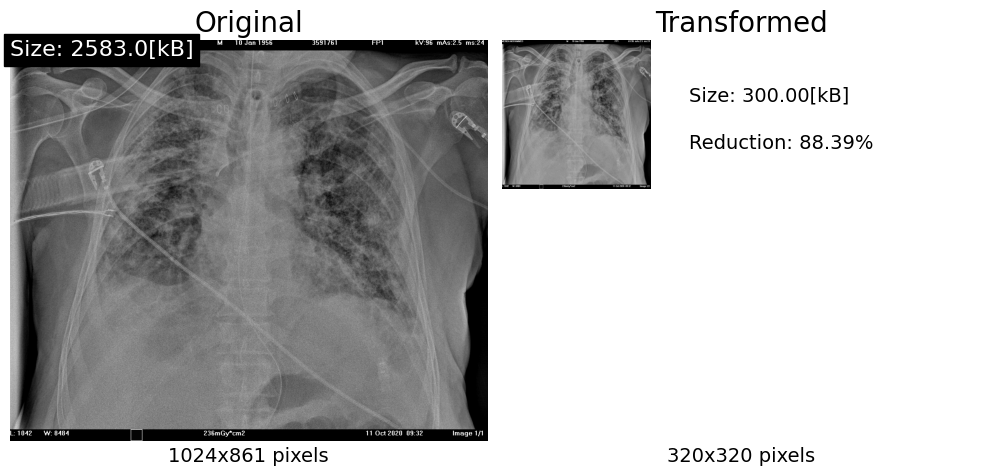

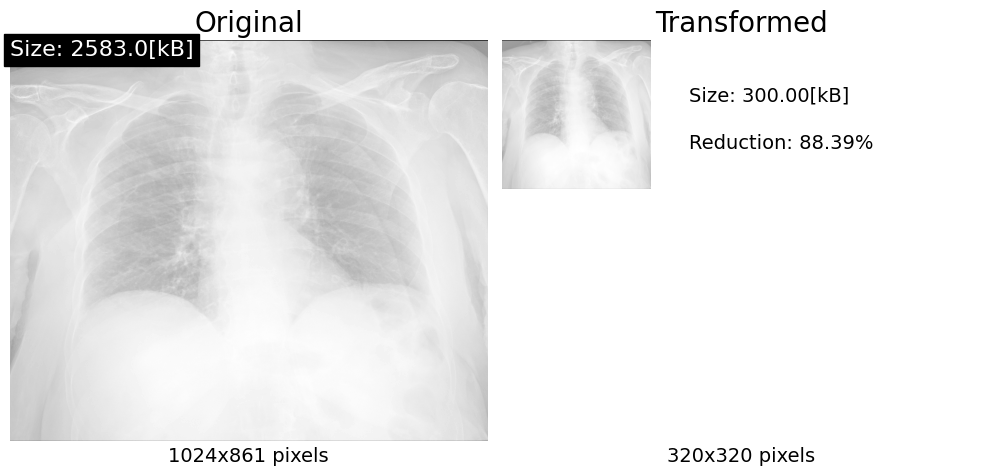

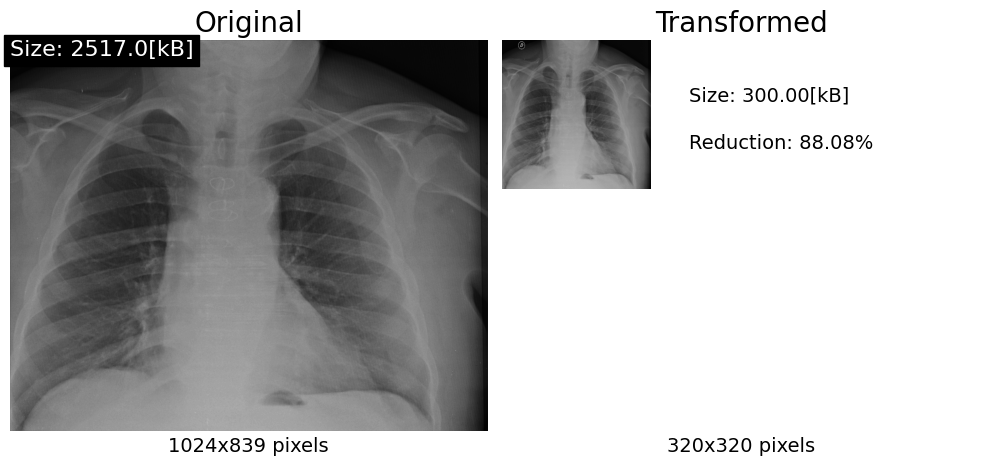

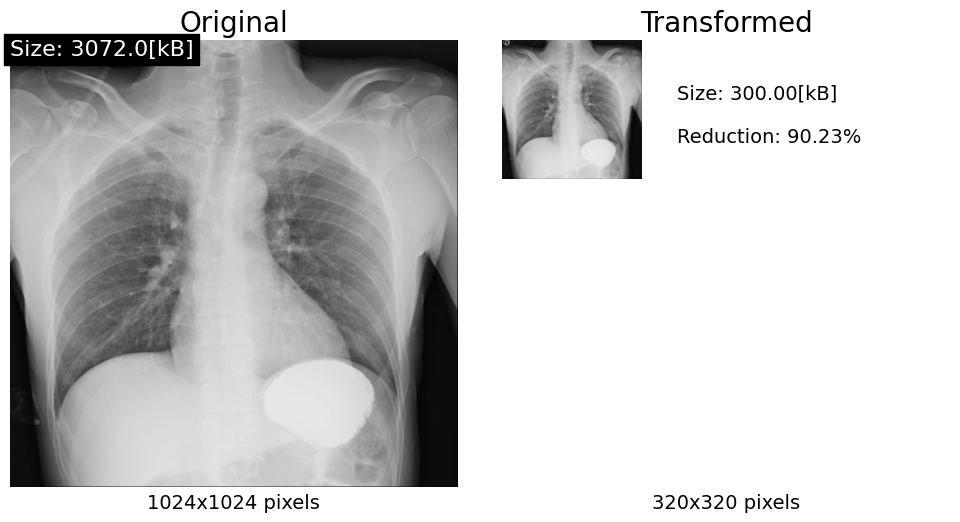

4


In [1]:
from stages import stage1,stage2,stage3,stage4,stage5,stage6
BASE_PATH = '../../datasets/covid/muestras_ejemplo/train'
N = 4
r_1 = stage1(BASE_PATH,N)

- Dimensiones de la imagen
- Formato de color
- Extension del archivo

./runs/detect/exp2


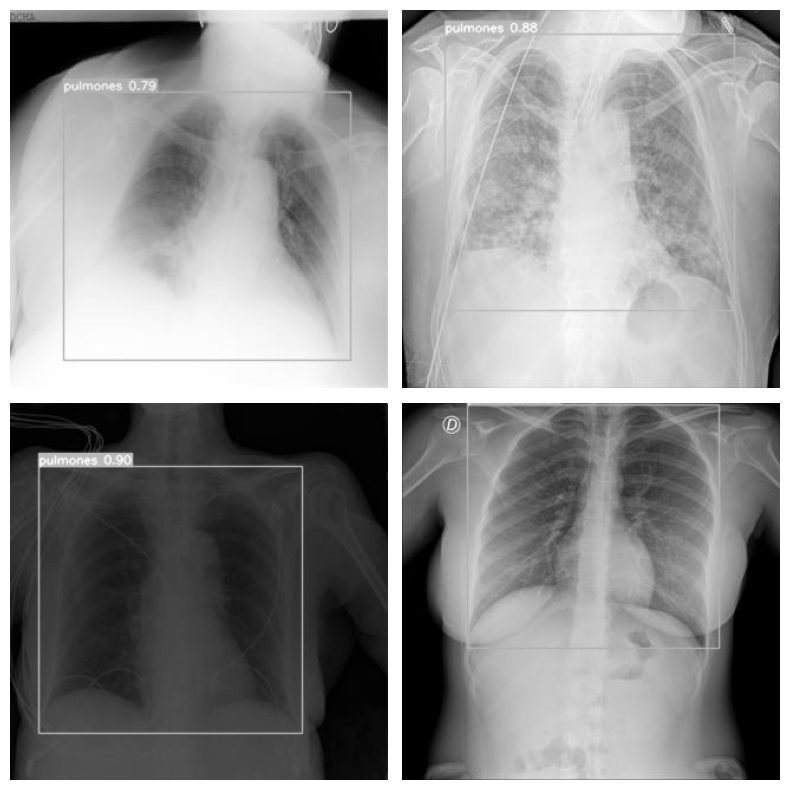

In [2]:
stage2(r_1, N)

- Probabilidad de presencia de pulmones
- Sección pulmonar

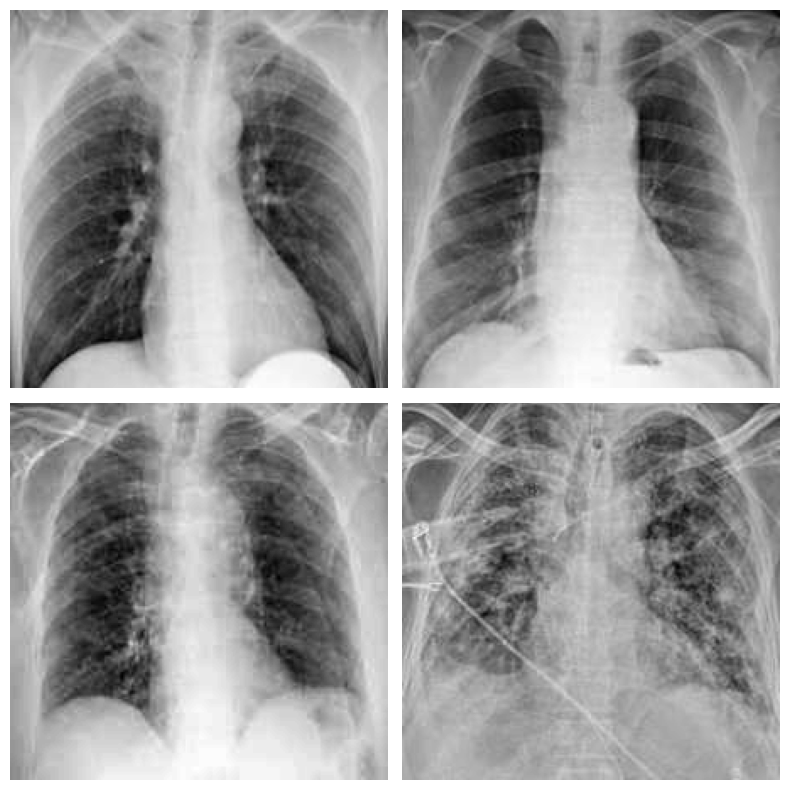

In [3]:
stage3('./detection.csv','./tmp_save_images','./tmp_save_images/tm4',N)

- Imágenes reducidas a solo pulmones

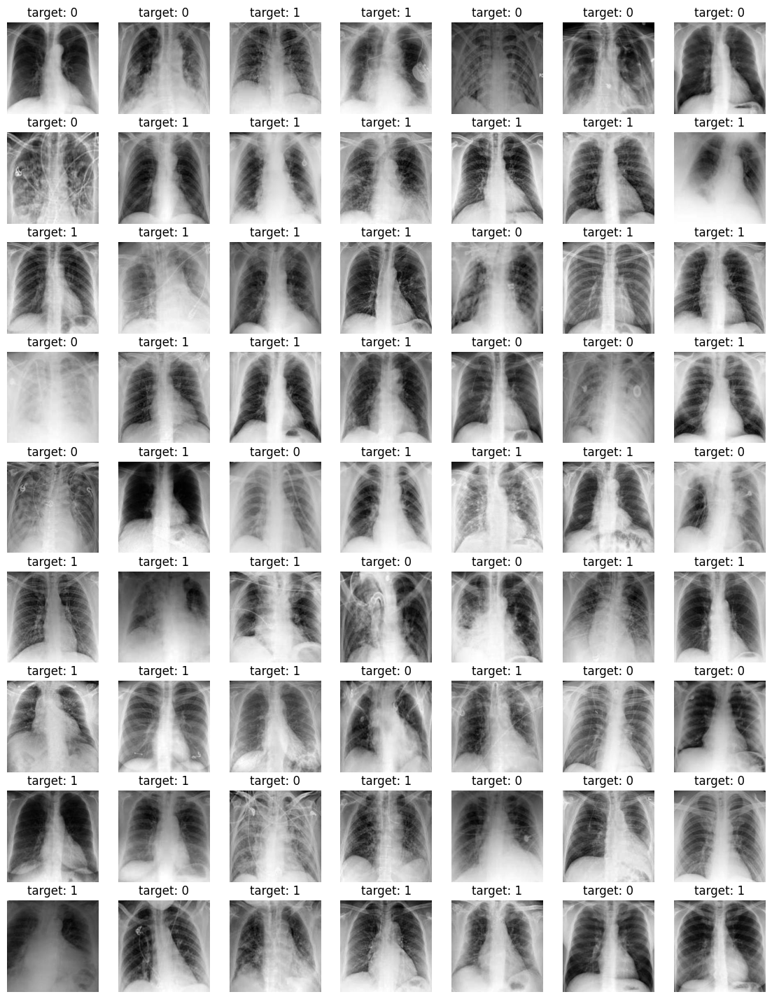

In [4]:
df_images = stage4()

## Anomalías

(12000, 11)


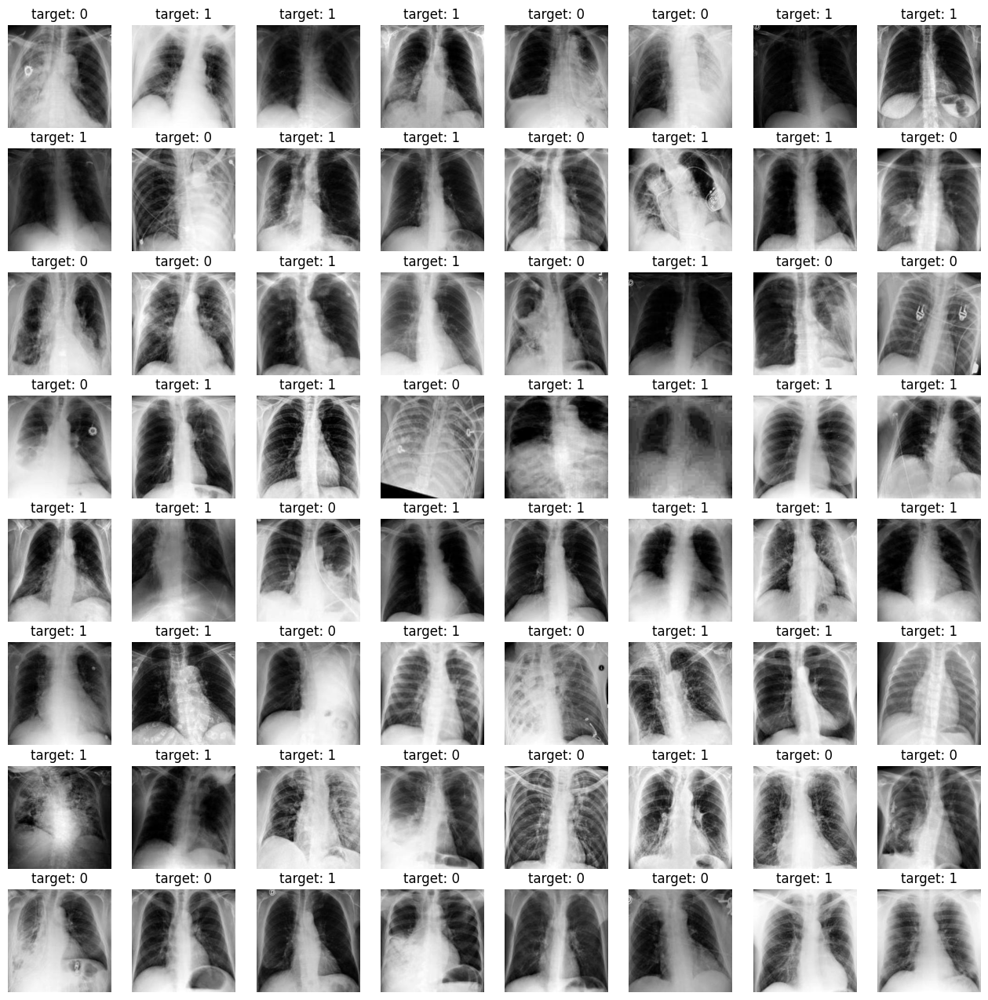

In [5]:
stage5(df_images)

(12000, 11)


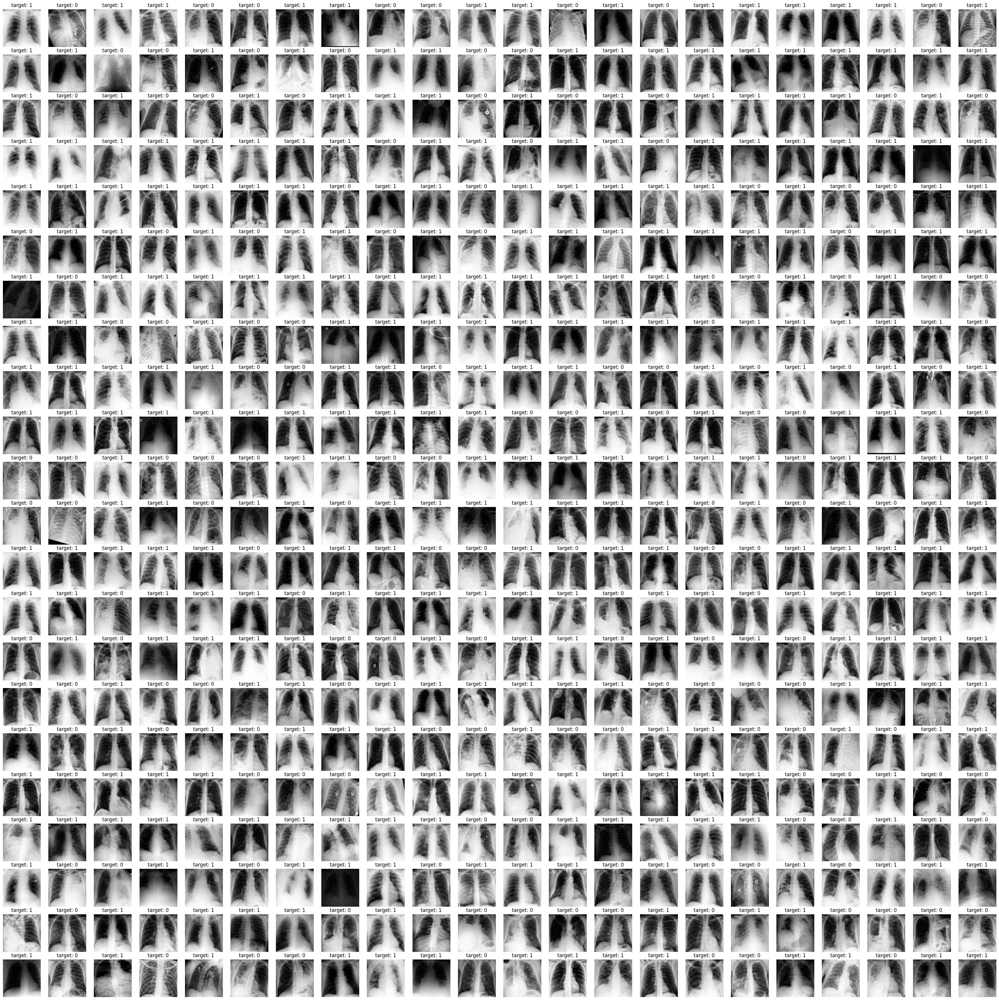

In [6]:
df_images_clean, df_images_anomalies = stage6(df_images)

In [11]:
df_images_clean.shape, df_images_anomalies.shape

((11481, 11), (519, 11))

# KVecinos Ajuste

In [3]:
def loadClean():
    import pandas as pd
    df_images_clean = pd.read_csv('../../datasets/covid/usable/train/train_sin_anomalias.csv')
    return df_images_clean
df_images_clean = loadClean()

In [40]:
from sklearn.base import BaseEstimator, TransformerMixin
class ImageLoader(BaseEstimator, TransformerMixin):
        def __init__(self, path_col='path'):
            self.path_col = path_col
        def fit(self, X, y=None):
            return self
        def transform(self, X):
            from PIL import Image
            import numpy as np
            images = []
            for path in X[self.path_col]:
                image = Image.open(path).convert('L')
                vector = np.array(image).flatten()
                images.append(vector)
            return np.array(images)

(4640, 87)


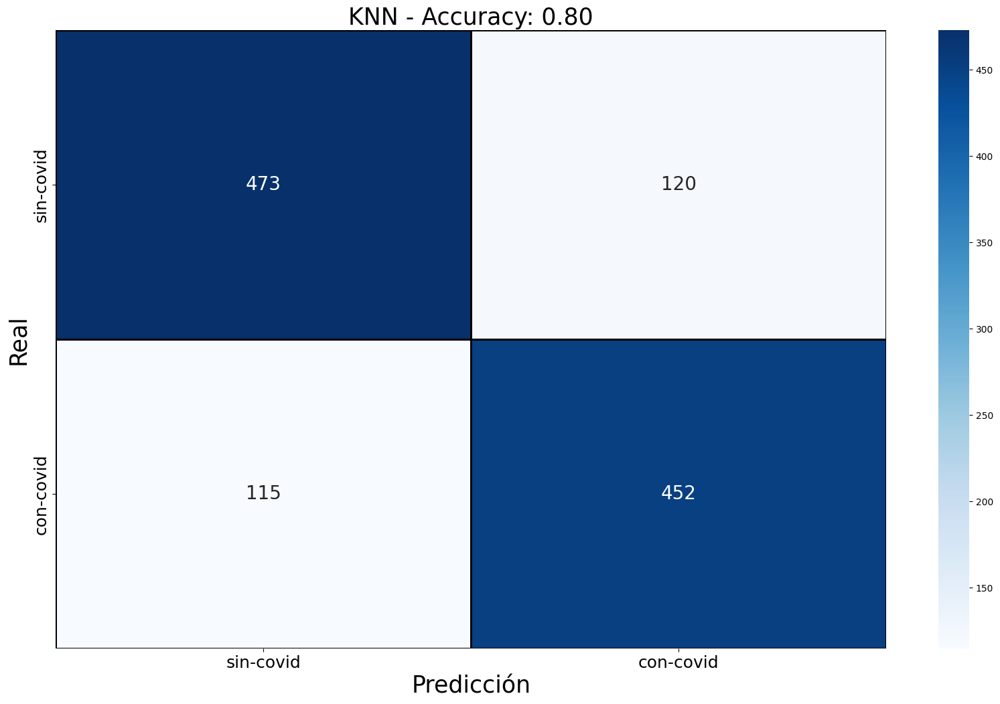

In [ ]:
def split(df):
    from sklearn.model_selection import train_test_split
    df_X = df[['path']]
    y = df['target'].values
    X_train, X_test, y_train, y_test = train_test_split(df_X, y, test_size=0.2, random_state=42,stratify=y)
    index = X_test.index
    df_test = df.loc[index]
    return X_train, X_test, y_train, y_test, df_test
def pipe(df):
    from sklearn.pipeline import make_pipeline
    from sklearn.decomposition import PCA
    from sklearn.preprocessing import StandardScaler
    import numpy as np
    from PIL import Image
    from sklearn.neighbors import KNeighborsClassifier
    import matplotlib.pyplot as plt
    from sklearn.model_selection import GridSearchCV
    import numpy as np
    from seaborn import heatmap
    from sklearn.metrics import confusion_matrix,accuracy_score
    X_train, X_test, y_train, y_test,df_test = split(df)
    pipe_image_loader = make_pipeline(ImageLoader())
    X_train = pipe_image_loader.transform(X_train)
    X_test = pipe_image_loader.transform(X_test)
    pipe_transform = make_pipeline(StandardScaler(),PCA(n_components=.95))
    X_transform = pipe_transform.fit_transform(X_train)
    param_grid = {
        'kneighborsclassifier__n_neighbors': [3, 5,7,8, 9],
        'kneighborsclassifier__weights': ['uniform', 'distance'],
        'kneighborsclassifier__algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
    }
    pipe_model = make_pipeline(KNeighborsClassifier())
    grid = GridSearchCV(pipe_model, param_grid, cv=5, n_jobs=-1)
    grid.fit(X_transform, y_train)
    best_model = grid.best_estimator_
    y_pred = best_model.predict(pipe_transform.transform(X_test))
    plt.figure(figsize=(20, 12))
    titulo_grafica = f'KNN - Accuracy: {accuracy_score(y_test, y_pred):.2f}'
    plt.title(titulo_grafica, fontsize=25)
    map_etiquetas = {0:'sin-covid',1:'con-covid'}
    matriz_confusion = confusion_matrix(y_test, y_pred)
    ax = heatmap(matriz_confusion, annot=True, fmt='d', cmap='Blues', xticklabels=map_etiquetas, yticklabels=map_etiquetas, linewidths=1, linecolor='black', annot_kws={"size": 20})
    ax.set_xticklabels(['sin-covid','con-covid'],fontdict={'fontsize':18})
    ax.set_yticklabels(['sin-covid','con-covid'],fontdict={'fontsize':18})
    ax.set_xlabel('Predicción',fontsize=25)
    ax.set_ylabel('Real',fontsize=25)
    plt.show()
    return best_model, pipe_transform,df_test
# best_model,pipe_transform,df_test = pipe(df_images_clean.sample(5800))

## Resultados

In [55]:
import pandas as pd
import joblib   
df_test = pd.read_csv('../../datasets/covid/usable/train/test_sin_anomalias_no_ent.csv')

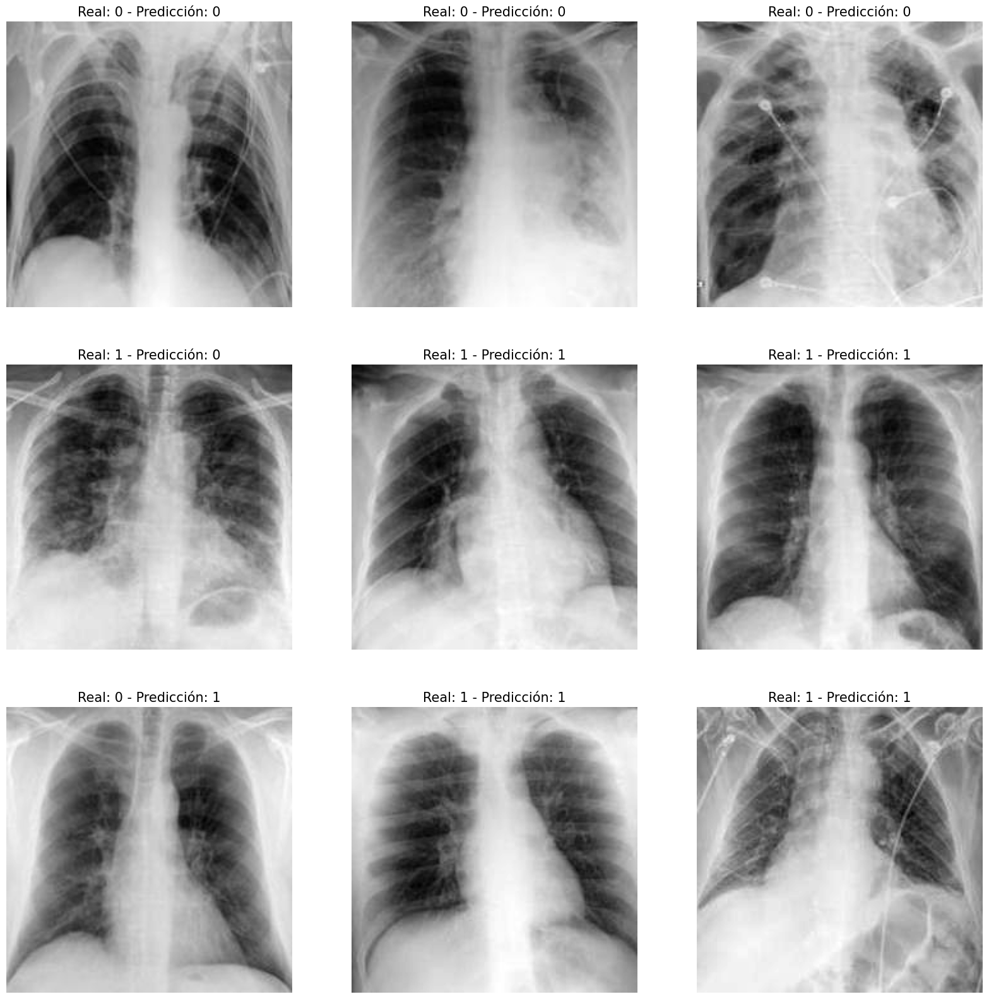

In [56]:
def plot_images_and_prediction(y_pred,df):
    import matplotlib.pyplot as plt
    from PIL import Image
    _, axs = plt.subplots(3, 3, figsize=(20, 20))
    for i, ax in enumerate(axs.flatten()):
        path = df.iloc[i]['path']
        image = Image.open(path).convert('L')
        ax.imshow(image,cmap='gray')
        y_real = df.iloc[i]['target']
        y_pred_label = y_pred[i]
        ax.set_title(f'Real: {y_real} - Predicción: {y_pred_label}',fontsize=15)
        ax.axis('off')
    plt.show()
df_sample = df_test.sample(9)
imgLoad  = ImageLoader()
X = imgLoad.transform(df_sample)
model = joblib.load('./best_model.pkl')
transformador = joblib.load('./pipe_transform.pkl')
X_transform = transformador.transform(X)
y_pred = model.predict(X_transform)
plot_images_and_prediction(y_pred,df_sample)